In [76]:
import matplotlib.pyplot as plt
import numpy as np
import warnings
import pandas as pd
import pandas_datareader.data as web
import datetime as dt
import yfinance as yf
import statsmodels.api as sm
import pandas_ta
from statsmodels.regression.rolling import RollingOLS
# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")


sp500 = pd.read_html('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies')[0]

sp500['Symbol'] = sp500['Symbol'].str.replace('.', '-')
symbol_list = sp500['Symbol'].unique().tolist()

end_date = '2025-01-01'
start_date = '2008-01-01'

df = yf.download(symbol_list, start=start_date, end=end_date).stack()
df

[*********************100%***********************]  503 of 503 completed


Price                   Close        High         Low        Open        Volume
Date       Ticker                                                              
2008-01-02 A        23.164263   23.483329   23.049398   23.400372  2.598742e+06
           AAPL      5.855757    6.018651    5.786934    5.988898  1.079179e+09
           ABT      17.952404   18.219391   17.855903   18.061772  1.121613e+07
           ACGL      7.235281    7.443422    7.202527    7.401160  3.843900e+06
           ACN      26.195301   26.623899   25.962842   26.427761  3.455600e+06
...                       ...         ...         ...         ...           ...
2024-12-31 XYL     115.293098  116.376273  114.845921  116.048339  6.416000e+05
           YUM     132.877213  133.501178  131.975910  132.807875  1.217100e+06
           ZBH     105.404167  106.272310  104.735601  105.683575  6.833000e+05
           ZBRA    386.220001  387.410004  381.750000  383.420013  3.279000e+05
           ZTS     161.892609  162.707395  160.839360  161.862801  1.327400e+06

[2007489 rows x 5 columns]

In [77]:
stacked_df = df  # MultiIndex: (Date, Ticker)
stacked_df['garman_klass_vol'] = (
    ((np.log(stacked_df['High']) - np.log(stacked_df['Low'])) ** 2) / 2 -
    (2 * np.log(2) - 1) * ((np.log(stacked_df['Close']) - np.log(stacked_df['Open'])) ** 2)
)
stacked_df['rsi'] = df.groupby(level=1)['Close'].transform(lambda x: pandas_ta.rsi(x, length=20))
stacked_df['bb_low'] = df.groupby(level=1)['Close'].transform(lambda x: pandas_ta.bbands(np.log1p(x), length=20).iloc[:,0])
stacked_df['bb_mid'] = df.groupby(level=1)['Close'].transform(lambda x: pandas_ta.bbands(np.log1p(x), length=20).iloc[:,1])
stacked_df['bb_high'] = df.groupby(level=1)['Close'].transform(lambda x: pandas_ta.bbands(np.log1p(x), length=20).iloc[:,2])

def compute_atr(stock_data):
    high = stock_data['High']
    low = stock_data['Low']
    close = stock_data['Close']
    
    atr = pandas_ta.atr(high, low, close, length=14)
    return atr.sub(atr.mean()).div(atr.std())
stacked_df['atr'] = stacked_df.groupby(level=1,group_keys=False).apply(compute_atr)

def compute_macd(close):
    macd = pandas_ta.macd(close, length=20).iloc[:,0]
    return macd.sub(macd.mean()).div(macd.std()) 
stacked_df['macd'] = stacked_df.groupby(level=1)['Close'].transform(compute_macd)   
stacked_df['dollar_volume'] = (stacked_df['Close'] * stacked_df['Volume'])/1e6
df = stacked_df
df

Price                   Close        High  ...      macd  dollar_volume
Date       Ticker                          ...                         
2008-01-02 A        23.164263   23.483329  ...       NaN      60.197943
           AAPL      5.855757    6.018651  ...       NaN    6319.409068
           ABT      17.952404   18.219391  ...       NaN     201.356533
           ACGL      7.235281    7.443422  ...       NaN      27.811698
           ACN      26.195301   26.623899  ...       NaN      90.520482
...                       ...         ...  ...       ...            ...
2024-12-31 XYL     115.293098  116.376273  ... -1.994819      73.972052
           YUM     132.877213  133.501178  ... -0.624597     161.724855
           ZBH     105.404167  106.272310  ... -0.445165      72.022667
           ZBRA    386.220001  387.410004  ... -0.470033     126.641538
           ZTS     161.892609  162.707395  ... -2.108881     214.896249

[2007489 rows x 13 columns]

In [78]:
last_cols = [c for c in df.columns.unique(0) if c not in ['dollar_volume', 'Volume', 'Open',
                                                          'High', 'Low']]
data = pd.concat([df.unstack('Ticker')['dollar_volume'].resample('M').mean().stack('Ticker').to_frame('dollar_volume'),df.unstack('Ticker')[last_cols].resample('M').last().stack('Ticker')],axis =1).dropna()
data

dollar_volume       Close  ...       atr      macd
Date       Ticker                             ...                    
2008-02-29 A          117.453691   19.533281  ... -0.763346 -0.535139
           AAPL      4660.564120    3.757373  ... -0.763123 -0.403322
           ABT        239.780274   17.319069  ... -0.743675 -0.506803
           ACGL        22.748862    7.235281  ... -0.767829 -0.225087
           ACN         96.419815   25.606880  ... -0.761405 -0.068711
...                          ...         ...  ...       ...       ...
2024-12-31 XYL        160.744518  115.293098  ...  1.018711 -1.994819
           YUM        204.737631  132.877213  ...  1.429001 -0.624597
           ZBH        160.679449  105.404167  ...  0.038058 -0.445165
           ZBRA       121.307398  386.220001  ...  0.850292 -0.470033
           ZTS        404.846222  161.892609  ...  0.763180 -2.108881

[95228 rows x 9 columns]

In [79]:
data['dollar_volume']= (data.loc[:,'dollar_volume'].unstack('Ticker').rolling(5*12).mean().stack())
data['dollar_vol_rank'] = data.groupby('Date')['dollar_volume'].rank(ascending=False)
data = data[data['dollar_vol_rank'] <= 200].drop(['dollar_volume', 'dollar_vol_rank'], axis=1)
data

Close  garman_klass_vol  ...       atr      macd
Date       Ticker                                ...                    
2013-01-31 A        28.861399          0.000043  ... -0.855065  0.391329
           AAPL     13.810954          0.000040  ... -0.578354 -0.638417
           ABT      26.794346          0.000086  ... -0.817698  0.171223
           ACN      57.482277          0.000077  ... -0.776019  0.062447
           ADBE     37.830002          0.000097  ... -0.843147 -0.061447
...                       ...               ...  ...       ...       ...
2024-12-31 WM      201.044128          0.000030  ...  1.787252 -4.030529
           WMT      89.885246          0.000045  ...  3.725695  1.100168
           WYNN     85.702927          0.000049  ... -0.682882 -0.564755
           XOM     105.643356          0.000131  ...  0.949433 -3.081116
           ZTS     161.892609          0.000067  ...  0.763180 -2.108881

[28800 rows x 8 columns]

In [80]:
def calulate_returns(df):
    lags = [1,2,3,4,5,6,7,8,9,10]
    outliers = 0.005
    closeprice = df['Close']
    for lag in lags:
        df[f'return_{lag}m'] = (closeprice
                                .pct_change(periods=lag)
                                .pipe(lambda x: x.clip(lower=x.quantile(outliers), upper=x.quantile(1-outliers)))
                                .add(1)
                                .div(1/lag)
                                .sub(1))
    return df
data = data.groupby(level=1,group_keys= False).apply(calulate_returns)
data

Close  garman_klass_vol  ...  return_9m  return_10m
Date       Ticker                                ...                       
2013-01-31 A        28.861399          0.000043  ...        NaN         NaN
           AAPL     13.810954          0.000040  ...        NaN         NaN
           ABT      26.794346          0.000086  ...        NaN         NaN
           ACN      57.482277          0.000077  ...        NaN         NaN
           ADBE     37.830002          0.000097  ...        NaN         NaN
...                       ...               ...  ...        ...         ...
2024-12-31 WM      201.044128          0.000030  ...        NaN         NaN
           WMT      89.885246          0.000045  ...  12.629773   14.600230
           WYNN     85.702927          0.000049  ...   6.650346    7.260403
           XOM     105.643356          0.000131  ...   7.533514    9.544879
           ZTS     161.892609          0.000067  ...   7.732000    7.277685

[28800 rows x 18 columns]

In [81]:
factor_data = web.DataReader('F-F_Research_Data_5_Factors_2x3_daily',
                               'famafrench',
                               start='2004')[0].drop('RF', axis=1)

factor_data = factor_data.resample('M').last().div(100)

factor_data.index.name = 'Date'

factor_data = factor_data.join(data['return_1m']).sort_index()

factor_data

Mkt-RF     SMB     HML     RMW     CMA  return_1m
Date       Ticker                                                   
2013-01-31 A      -0.0007  0.0070  0.0016 -0.0021  0.0005        NaN
           AAPL   -0.0007  0.0070  0.0016 -0.0021  0.0005        NaN
           ABT    -0.0007  0.0070  0.0016 -0.0021  0.0005        NaN
           ACN    -0.0007  0.0070  0.0016 -0.0021  0.0005        NaN
           ADBE   -0.0007  0.0070  0.0016 -0.0021  0.0005        NaN
...                   ...     ...     ...     ...     ...        ...
2024-12-31 WM     -0.0046  0.0032  0.0071  0.0032  0.0002  -0.111779
           WMT    -0.0046  0.0032  0.0071  0.0032  0.0002  -0.021079
           WYNN   -0.0046  0.0032  0.0071  0.0032  0.0002  -0.087095
           XOM    -0.0046  0.0032  0.0071  0.0032  0.0002  -0.088081
           ZTS    -0.0046  0.0032  0.0071  0.0032  0.0002  -0.070300

[28800 rows x 6 columns]

In [82]:
observation = factor_data.groupby(level=1).size()
valid_stocks = observation[observation >= 10]
factor_data = factor_data[factor_data.index.get_level_values('Ticker').isin(valid_stocks.index)]
factor_data

Mkt-RF     SMB     HML     RMW     CMA  return_1m
Date       Ticker                                                   
2013-01-31 A      -0.0007  0.0070  0.0016 -0.0021  0.0005        NaN
           AAPL   -0.0007  0.0070  0.0016 -0.0021  0.0005        NaN
           ABT    -0.0007  0.0070  0.0016 -0.0021  0.0005        NaN
           ACN    -0.0007  0.0070  0.0016 -0.0021  0.0005        NaN
           ADBE   -0.0007  0.0070  0.0016 -0.0021  0.0005        NaN
...                   ...     ...     ...     ...     ...        ...
2024-12-31 WFC    -0.0046  0.0032  0.0071  0.0032  0.0002  -0.077852
           WMT    -0.0046  0.0032  0.0071  0.0032  0.0002  -0.021079
           WYNN   -0.0046  0.0032  0.0071  0.0032  0.0002  -0.087095
           XOM    -0.0046  0.0032  0.0071  0.0032  0.0002  -0.088081
           ZTS    -0.0046  0.0032  0.0071  0.0032  0.0002  -0.070300

[28759 rows x 6 columns]

In [83]:
betas = (factor_data.groupby(level=1,
                            group_keys=False)
         .apply(lambda x: RollingOLS(endog=x['return_1m'], 
                                     exog=sm.add_constant(x.drop('return_1m', axis=1)),
                                     window=min(24, x.shape[0]),
                                     min_nobs=len(x.columns)+1)
         .fit(params_only=True)
         .params
         .drop('const', axis=1)))

betas 

Mkt-RF       SMB       HML        RMW       CMA
Date       Ticker                                                   
2013-01-31 A            NaN       NaN       NaN        NaN       NaN
           AAPL         NaN       NaN       NaN        NaN       NaN
           ABT          NaN       NaN       NaN        NaN       NaN
           ACN          NaN       NaN       NaN        NaN       NaN
           ADBE         NaN       NaN       NaN        NaN       NaN
...                     ...       ...       ...        ...       ...
2024-12-31 WFC    -1.023958 -0.096281 -0.279232   3.058684  0.784481
           WMT     2.169624 -2.273154  2.001009   0.414565  0.234543
           WYNN    0.266956  6.900928 -5.079071  12.995814 -9.747887
           XOM     0.937790  0.637362  0.327992   3.592961 -0.570169
           ZTS     3.101042  0.632810 -1.353758   5.098707 -1.249132

[28759 rows x 5 columns]

In [84]:
factors = ['Mkt-RF', 'SMB', 'HML', 'RMW', 'CMA']

data = (data.join(betas.groupby('Ticker').shift()))

data.loc[:, factors] = data.groupby('Ticker', group_keys=False)[factors].apply(lambda x: x.fillna(x.mean()))

data = data.drop('Close', axis=1)

data = data.dropna()

data.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 26004 entries, (Timestamp('2013-11-30 00:00:00'), 'A') to (Timestamp('2024-12-31 00:00:00'), 'ZTS')
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   garman_klass_vol  26004 non-null  float64
 1   rsi               26004 non-null  float64
 2   bb_low            26004 non-null  float64
 3   bb_mid            26004 non-null  float64
 4   bb_high           26004 non-null  float64
 5   atr               26004 non-null  float64
 6   macd              26004 non-null  float64
 7   return_1m         26004 non-null  float64
 8   return_2m         26004 non-null  float64
 9   return_3m         26004 non-null  float64
 10  return_4m         26004 non-null  float64
 11  return_5m         26004 non-null  float64
 12  return_6m         26004 non-null  float64
 13  return_7m         26004 non-null  float64
 14  return_8m         26004 non-null  float64
 15  return_9m    

In [85]:
from sklearn.cluster import KMeans
def cluster_stocks(df):
    df['Cluster'] = KMeans(n_clusters=5,random_state=0,init='random').fit(df).labels_
    return df
data = data.groupby(level='Date', group_keys=False).apply(cluster_stocks)
data

garman_klass_vol        rsi  ...        CMA  Cluster
Date       Ticker                               ...                    
2013-11-30 A               0.000035  57.521598  ...   9.322343        0
           AAPL            0.000126  69.268302  ...   3.858825        2
           ABT             0.000044  60.845896  ...   4.492177        0
           ACN             0.000063  59.547851  ...   4.021852        0
           ADBE            0.000030  61.179282  ...   1.927434        0
...                             ...        ...  ...        ...      ...
2024-12-31 WFC             0.000068  49.517632  ...   0.347283        2
           WMT             0.000045  50.924168  ...   0.076845        2
           WYNN            0.000049  41.088626  ... -10.299582        4
           XOM             0.000131  35.592926  ...  -0.990028        0
           ZTS             0.000067  34.077559  ...  -1.532743        0

[26004 rows x 23 columns]

In [86]:
def plot_clusters(data):

    cluster_0 = data[data['Cluster']==0]
    cluster_1 = data[data['Cluster']==1]
    cluster_2 = data[data['Cluster']==2]
    cluster_3 = data[data['Cluster']==3]

    plt.scatter(cluster_0.iloc[:,5] , cluster_0.iloc[:,1] , color = 'red', label='cluster 0')
    plt.scatter(cluster_1.iloc[:,5] , cluster_1.iloc[:,1] , color = 'green', label='cluster 1')
    plt.scatter(cluster_2.iloc[:,5] , cluster_2.iloc[:,1] , color = 'blue', label='cluster 2')
    plt.scatter(cluster_3.iloc[:,5] , cluster_3.iloc[:,1] , color = 'black', label='cluster 3')
    
    plt.legend()
    plt.show()
    return

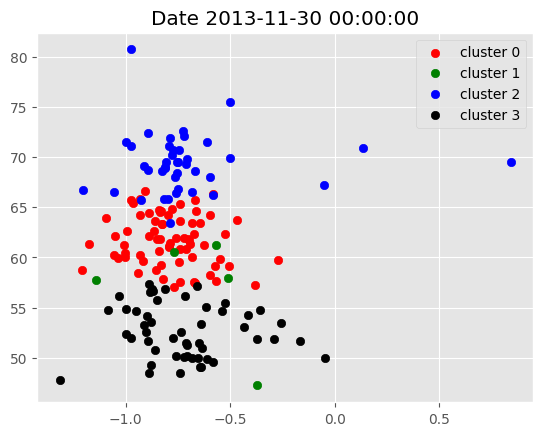

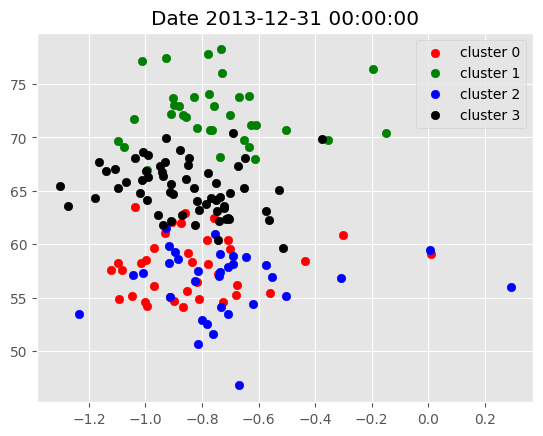

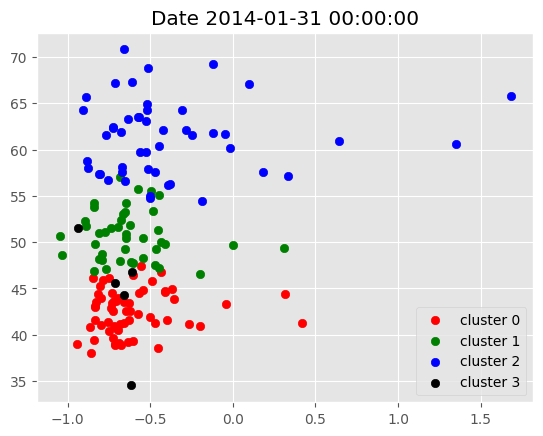

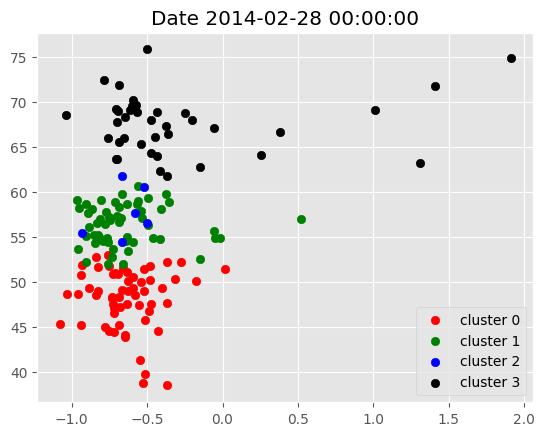

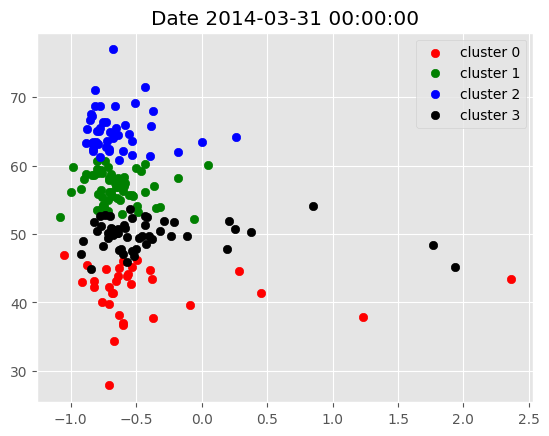

...

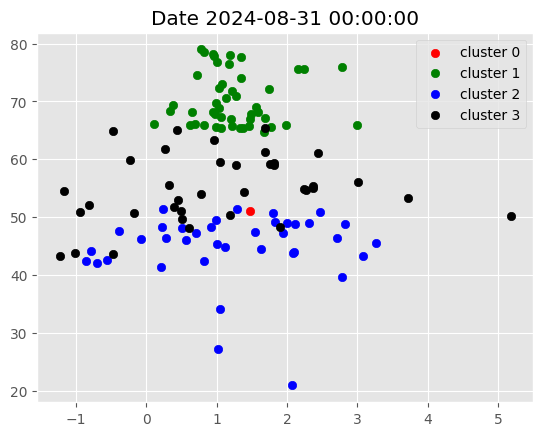

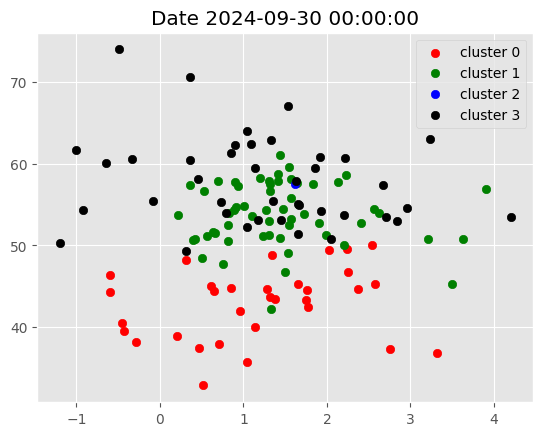

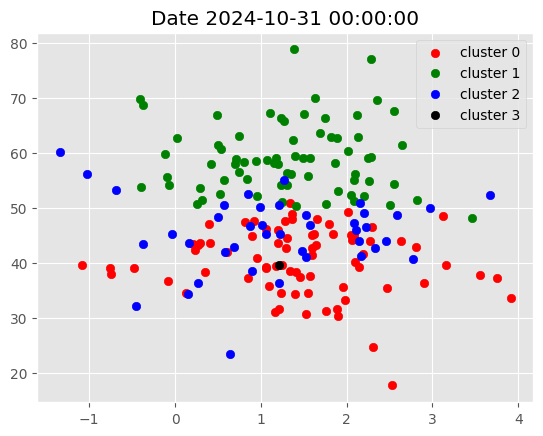

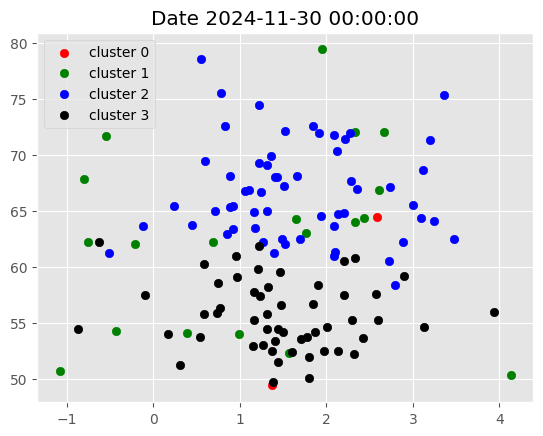

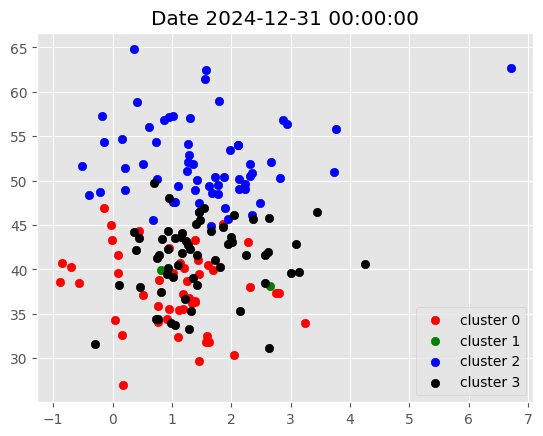

In [87]:
plt.style.use('ggplot')

for i in data.index.get_level_values('Date').unique().tolist():
    
    g = data.xs(i, level=0)
    
    plt.title(f'Date {i}')
    
    plot_clusters(g)

In [88]:
target_rsi_values = [30, 45, 55, 70]

initial_centroids = np.zeros((len(target_rsi_values), 22))

initial_centroids[:, 1] = target_rsi_values

initial_centroids

array([[ 0., 30.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., 45.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., 55.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., 70.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.]])

In [89]:
from sklearn.cluster import KMeans
def cluster_stocks(df):
    df['Cluster'] = KMeans(n_clusters=4,random_state=0,init=initial_centroids).fit(df).labels_
    return df
data = data.groupby(level='Date', group_keys=False).apply(cluster_stocks)
data

ValueError: The shape of the initial centers (4, 22) does not match the number of features of the data 23.

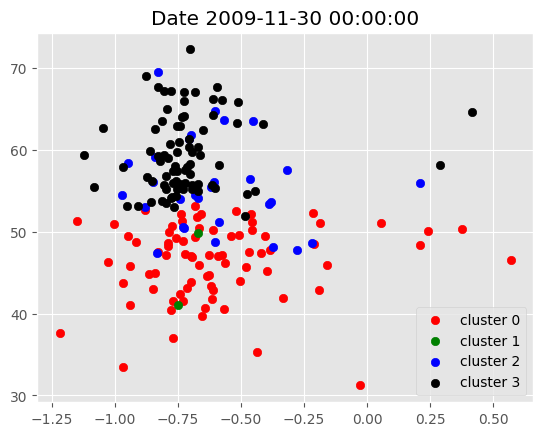

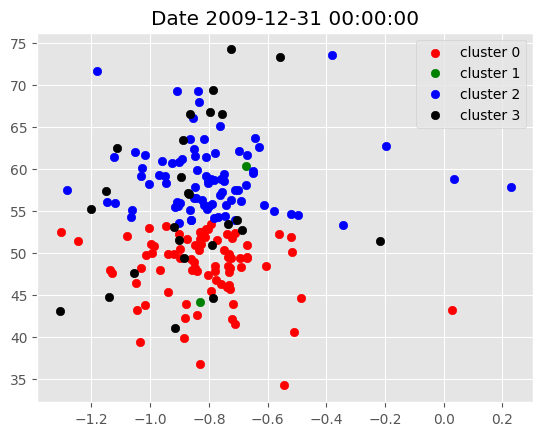

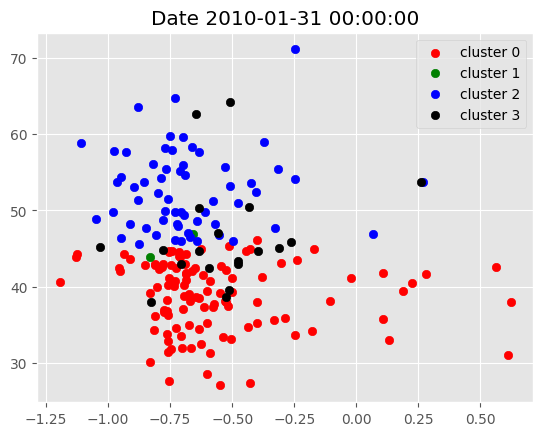

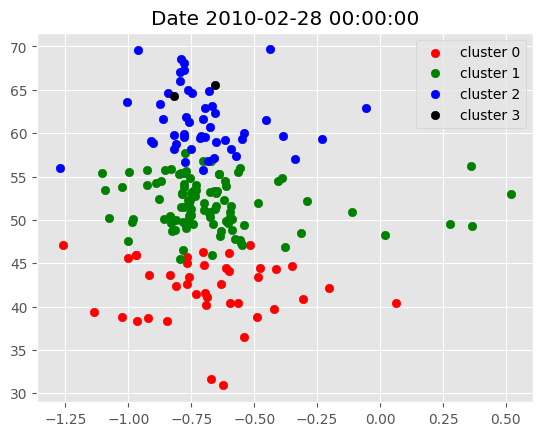

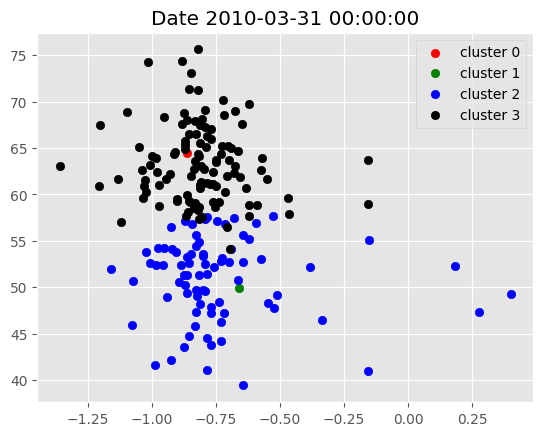

...

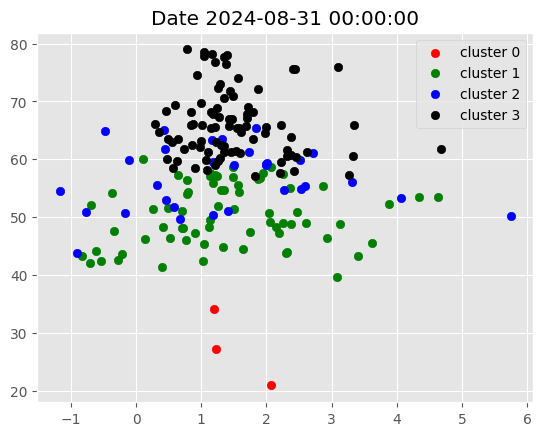

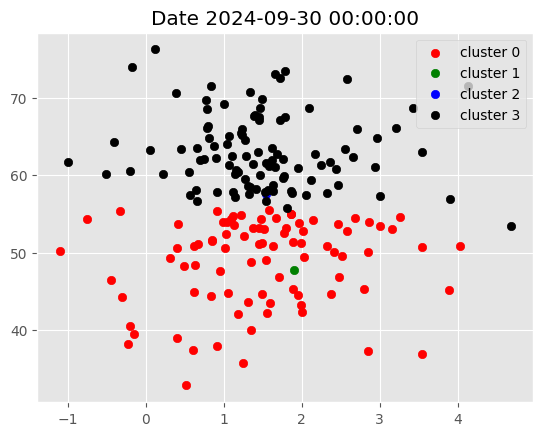

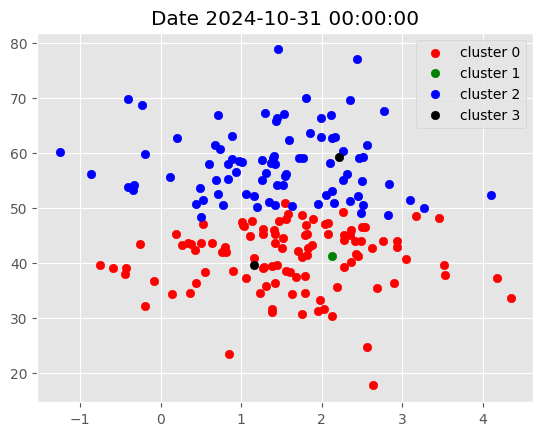

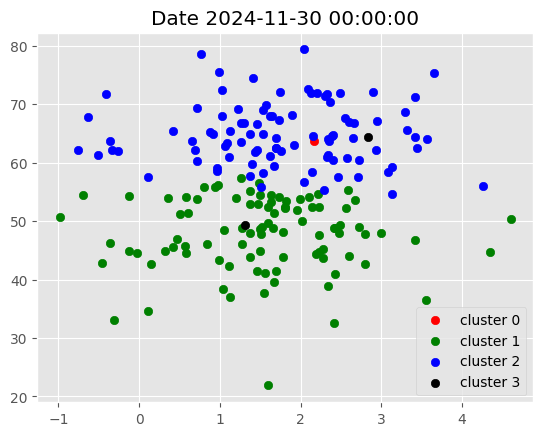

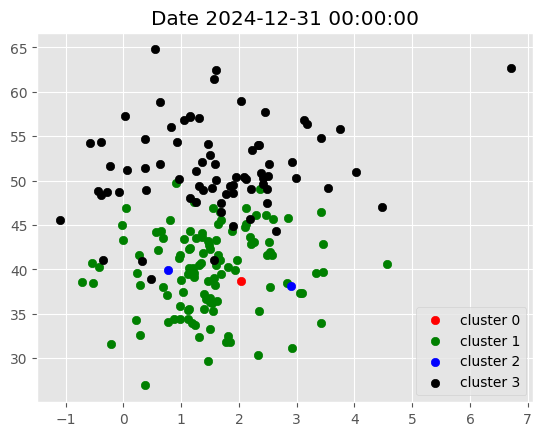

In [ ]:
plt.style.use('ggplot')

for i in data.index.get_level_values('Date').unique().tolist():
    
    g = data.xs(i, level=0)
    
    plt.title(f'Date {i}')
    
    plot_clusters(g)

In [93]:
filter_df = data[data['Cluster'] == 3].copy()
filter_df = filter_df.reset_index(level= 1)
filter_df.index = filter_df.index + pd.DateOffset(1)
filter_df = filter_df.reset_index().set_index(['Date','Ticker'])
dates = filter_df.index.get_level_values('Date').unique().tolist()
fixed_dates = {}
# 
for d in dates:
    
    fixed_dates[d.strftime('%Y-%m-%d')] = filter_df.xs(d, level=0).index.tolist()
    
fixed_dates

{'2013-12-01': ['ADM',
  'AIG',
  'AMAT',
  'AMD',
  'AMGN',
  'AMT',
  'APA',
  'BAX',
  'BBY',
  'BKR',
  'BMY',
  'BRK-B',
  'CAT',
  'CF',
  'CMI',
  'COP',
  'CVX',
  'DD',
  'DE',
  'DUK',
  'EMR',
  'F',
  'GIS',
  'HAL',
  'HES',
  'INTC',
  'JNPR',
  'KR',
  'LEN',
  'LIN',
  'LRCX',
  'LULU',
  'MCD',
  'MDLZ',
  'MDT',
  'MGM',
  'MO',
  'MOS',
  'NEE',
  'NTAP',
  'NVDA',
  'PARA',
  'PEP',
  'RF',
  'RL',
  'ROST',
  'SHW',
  'T',
  'VRTX',
  'VZ',
  'WBA'],
 '2014-01-01': ['A',
  'ACN',
  'ADI',
  'ADM',
  'ADP',
  'AMD',
  'AMZN',
  'AON',
  'AZO',
  'BK',
  'BLK',
  'CAT',
  'CB',
  'CSX',
  'DD',
  'DHR',
  'EMR',
  'ETN',
  'FCX',
  'FDX',
  'FFIV',
  'FITB',
  'GE',
  'GLW',
  'GS',
  'HD',
  'HON',
  'HPQ',
  'IBM',
  'ICE',
  'INTC',
  'INTU',
  'JNPR',
  'JPM',
  'KO',
  'LEN',
  'LIN',
  'LRCX',
  'MAR',
  'MDLZ',
  'MET',
  'MO',
  'MRK',
  'MSI',
  'NOC',
  'NSC',
  'PPG',
  'PRU',
  'QCOM',
  'RTX',
  'SCHW',
  'STT',
  'STX',
  'TJX',
  'TXN',
  'UNH',
  'UNP

In [181]:
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import risk_models
from pypfopt import expected_returns


def optimize_weights(prices,lower_bound = 0):
    returns = expected_returns.mean_historical_return(prices=prices , frequency=252)
    cov = risk_models.sample_cov(prices=prices, frequency=252)

    ef = EfficientFrontier(returns, cov, weight_bounds=(lower_bound, .1),solver='SCS')
    weights = ef.max_sharpe()

    return ef.clean_weights()


In [149]:
stocks = data.index.get_level_values('Ticker').unique().tolist()

new_df = yf.download(tickers=stocks,
                     start=data.index.get_level_values('Date').unique()[0]-pd.DateOffset(months=12),
                     end=data.index.get_level_values('Date').unique()[-1])

new_df

[*********************100%***********************]  255 of 255 completed


Price            Close                          ...    Volume                    
Ticker               A        AAPL        ABBV  ...       YUM      ZBH        ZTS
Date                                            ...                              
2012-11-30   24.618139   17.746325         NaN  ...  26020742  1248669        NaN
2012-12-03   24.380247   17.773914         NaN  ...   8555067   978809        NaN
2012-12-04   24.515272   17.460396         NaN  ...   8179358  1053896        NaN
2012-12-05   24.856030   16.336693         NaN  ...   5208739  1585582        NaN
2012-12-06   24.637424   16.592911         NaN  ...   6785159   889611        NaN
...                ...         ...         ...  ...       ...      ...        ...
2024-12-23  134.066849  254.655716  175.105225  ...   1479100  1948300  2437800.0
2024-12-24  135.560913  257.578674  176.685577  ...    533000   458600  1023600.0
2024-12-26  135.291977  258.396667  175.900314  ...   1040900  1277300  2167200.0
2024-12-27  135.003113  254.974930  174.732224  ...   1146300   743400  1800100.0
2024-12-30  133.887558  251.593079  172.955551  ...   1144600  1532000  1531400.0

[3040 rows x 1275 columns]

In [339]:
returns_dataframe = np.log(new_df['Close']).diff()

portfolio_df = pd.DataFrame()

for start_date in fixed_dates.keys():
       try:
              end_date = (pd.to_datetime(start_date)+pd.offsets.MonthEnd(0)).strftime('%Y-%m-%d')

              cols = fixed_dates[start_date]

              optimization_start_date = (pd.to_datetime(start_date)-pd.DateOffset(months=12)).strftime('%Y-%m-%d')

              optimization_end_date = (pd.to_datetime(start_date)-pd.DateOffset(days=1)).strftime('%Y-%m-%d')

              optimization_df = new_df['Close'][optimization_start_date:optimization_end_date][cols]

              sucess = False
              try:
                     weights = optimize_weights(prices=optimization_df,
                                                        lower_bound=round(1/(len(optimization_df.columns)*2),3))
                     
                     weights = pd.DataFrame(weights, index=pd.Series(0))
                     weights.stack().to_frame('Weight').reset_index(0,drop=True)
                     sucess = True
              except:
                     print(f'Max Sharpe Optimization failed for {start_date}, Continuing with Equal-Weights')

              if sucess == False:
                     weights = pd.DataFrame([(1/len(optimization_df.columns)) for i in range(len(optimization_df.columns))],
                                     index=optimization_df.columns.tolist(),
                                     columns=pd.Series(0)).T
              
              temp_df = returns_dataframe[start_date:end_date]



              temp_df = temp_df.stack().to_frame('return').reset_index(level=0)\
                            .merge(weights.stack().to_frame('weight').reset_index(level=0, drop=True),
                                   left_index=True,
                                   right_index=True)\
                            .reset_index().set_index(['Date','Ticker'])
              
              temp_df['weighted_return'] = temp_df['return']*temp_df['weight']
              temp_df = temp_df.groupby(level=0)['weighted_return'].sum().to_frame('Strategy Return')

              portfolio_df = pd.concat([portfolio_df, temp_df], axis=0)
       except Exception as e:
              print(e)

portfolio_df = portfolio_df.drop_duplicates()

portfolio_df

Max Sharpe Optimization failed for 2014-02-01, Continuing with Equal-Weights
Max Sharpe Optimization failed for 2014-11-01, Continuing with Equal-Weights
Max Sharpe Optimization failed for 2015-08-01, Continuing with Equal-Weights
Max Sharpe Optimization failed for 2016-05-01, Continuing with Equal-Weights
Max Sharpe Optimization failed for 2016-07-01, Continuing with Equal-Weights
Max Sharpe Optimization failed for 2017-07-01, Continuing with Equal-Weights
Max Sharpe Optimization failed for 2017-12-01, Continuing with Equal-Weights
Max Sharpe Optimization failed for 2018-04-01, Continuing with Equal-Weights
Max Sharpe Optimization failed for 2018-07-01, Continuing with Equal-Weights
Max Sharpe Optimization failed for 2018-11-01, Continuing with Equal-Weights
Max Sharpe Optimization failed for 2018-12-01, Continuing with Equal-Weights
Max Sharpe Optimization failed for 2019-01-01, Continuing with Equal-Weights
Max Sharpe Optimization failed for 2019-03-01, Continuing with Equal-Weights

,Strategy Return
Date,
2013-12-02,-0.000093
2013-12-03,-0.000597
2013-12-04,-0.000265
2013-12-05,-0.011319
2013-12-06,0.007086
...,...
2024-12-23,0.004041
2024-12-24,0.008340
2024-12-26,0.001355


In [340]:
spy = yf.download(tickers='SPY',
                  start='2012-01-01',
                  end=dt.date.today())
spy.columns = spy.columns.droplevel(1)
spy_ret = np.log(spy[['Close']]).diff().dropna().rename({'Close':'SPY Buy&Hold'}, axis=1)
portfolio_df = portfolio_df.merge(spy_ret,
                                  left_index=True,
                                  right_index=True)
portfolio_df

[*********************100%***********************]  1 of 1 completed


,Strategy Return,SPY Buy&Hold
Date,,
2013-12-02,-0.000093,-0.002600
2013-12-03,-0.000597,-0.004330
2013-12-04,-0.000265,-0.000111
2013-12-05,-0.011319,-0.004405
2013-12-06,0.007086,0.011115
...,...,...
2024-12-23,0.004041,0.005970
2024-12-24,0.008340,0.011054
2024-12-26,0.001355,0.000067


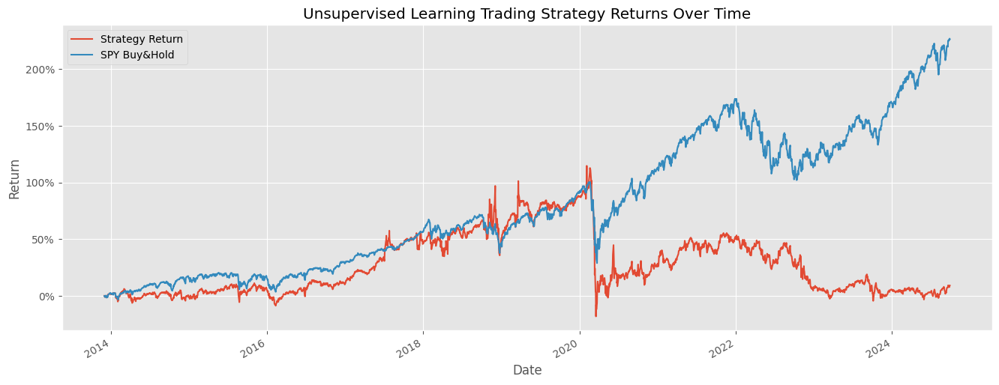

In [341]:
import matplotlib.ticker as mtick

plt.style.use('ggplot')

portfolio_cumulative_return = np.exp(np.log1p(portfolio_df).cumsum())-1

portfolio_cumulative_return[:'2024-09-29'].plot(figsize=(16,6))

plt.title('Unsupervised Learning Trading Strategy Returns Over Time')

plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1))

plt.ylabel('Return')

plt.show()